# House price prediction (Linear Regression)

## Import Important Libs

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso
sns.set()

In [2]:
# Load  data from csv file
houses_df = pd.read_csv('../input/housedata/data.csv') 
houses_df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


# <br> EDA [Exploratory Data Analysis] <br>

In [3]:
from pandas_profiling import ProfileReport
houses_price_profile=ProfileReport(houses_df,title='House Prices Profile')
houses_price_profile

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
houses_df.shape

(4600, 18)

In [5]:
houses_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4600 entries, 0 to 4599
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           4600 non-null   object 
 1   price          4600 non-null   float64
 2   bedrooms       4600 non-null   float64
 3   bathrooms      4600 non-null   float64
 4   sqft_living    4600 non-null   int64  
 5   sqft_lot       4600 non-null   int64  
 6   floors         4600 non-null   float64
 7   waterfront     4600 non-null   int64  
 8   view           4600 non-null   int64  
 9   condition      4600 non-null   int64  
 10  sqft_above     4600 non-null   int64  
 11  sqft_basement  4600 non-null   int64  
 12  yr_built       4600 non-null   int64  
 13  yr_renovated   4600 non-null   int64  
 14  street         4600 non-null   object 
 15  city           4600 non-null   object 
 16  statezip       4600 non-null   object 
 17  country        4600 non-null   object 
dtypes: float

In [6]:
houses_df.isnull().sum()


date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
street           0
city             0
statezip         0
country          0
dtype: int64

In [7]:
houses_df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,4600.0,551962.988473,563834.702547,0.0,322875.00,460943.461539,654962.50,26590000.0
bedrooms,4600.0,3.400870,0.908848,0.0,3.00,3.000000,4.00,9.0
bathrooms,4600.0,2.160815,0.783781,0.0,1.75,2.250000,2.50,8.0
sqft_living,4600.0,2139.346957,963.206916,370.0,1460.00,1980.000000,2620.00,13540.0
sqft_lot,4600.0,14852.516087,35884.436145,638.0,5000.75,7683.000000,11001.25,1074218.0
floors,4600.0,1.512065,0.538288,1.0,1.00,1.500000,2.00,3.5
waterfront,4600.0,0.007174,0.084404,0.0,0.00,0.000000,0.00,1.0
view,4600.0,0.240652,0.778405,0.0,0.00,0.000000,0.00,4.0
condition,4600.0,3.451739,0.677230,1.0,3.00,3.000000,4.00,5.0
sqft_above,4600.0,1827.265435,862.168977,370.0,1190.00,1590.000000,2300.00,9410.0


In [8]:
houses_df.corr(method ='pearson') 

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
price,1.000000,0.200336,0.327110,0.430410,0.050451,0.151461,0.135648,0.228504,0.034915,0.367570,0.210427,0.021857,-0.028774
bedrooms,0.200336,1.000000,0.545920,0.594884,0.068819,0.177895,-0.003483,0.111028,0.025080,0.484705,0.334165,0.142461,-0.061082
bathrooms,0.327110,0.545920,1.000000,0.761154,0.107837,0.486428,0.076232,0.211960,-0.119994,0.689918,0.298020,0.463498,-0.215886
sqft_living,0.430410,0.594884,0.761154,1.000000,0.210538,0.344850,0.117616,0.311009,-0.062826,0.876443,0.447206,0.287775,-0.122817
sqft_lot,0.050451,0.068819,0.107837,0.210538,1.000000,0.003750,0.017241,0.073907,0.000558,0.216455,0.034842,0.050706,-0.022730
floors,0.151461,0.177895,0.486428,0.344850,0.003750,1.000000,0.022024,0.031211,-0.275013,0.522814,-0.255510,0.467481,-0.233996
waterfront,0.135648,-0.003483,0.076232,0.117616,0.017241,0.022024,1.000000,0.360935,0.000352,0.078911,0.097501,-0.023563,0.008625
view,0.228504,0.111028,0.211960,0.311009,0.073907,0.031211,0.360935,1.000000,0.063077,0.174327,0.321602,-0.064465,0.022967
condition,0.034915,0.025080,-0.119994,-0.062826,0.000558,-0.275013,0.000352,0.063077,1.000000,-0.178196,0.200632,-0.399698,-0.186818
sqft_above,0.367570,0.484705,0.689918,0.876443,0.216455,0.522814,0.078911,0.174327,-0.178196,1.000000,-0.038723,0.408535,-0.160426


## Change Types

In [9]:
# Change to datetime type
houses_df['date'] = pd.to_datetime(houses_df['date'])
houses_df['date'].dtype

dtype('<M8[ns]')

In [10]:
houses_df['bedrooms'] = houses_df['bedrooms'].astype(int)
houses_df['bathrooms'] = houses_df['bathrooms'].astype(int)
houses_df['floors'] = houses_df['floors'].astype(int)

In [11]:
houses_df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02,313000.0,3,1,1340,7912,1,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02,2384000.0,5,2,3650,9050,2,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02,342000.0,3,2,1930,11947,1,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02,420000.0,3,2,2000,8030,1,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02,550000.0,4,2,1940,10500,1,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


# <br> Discover our Data <br>

In [12]:
houses_df.dtypes

date             datetime64[ns]
price                   float64
bedrooms                  int64
bathrooms                 int64
sqft_living               int64
sqft_lot                  int64
floors                    int64
waterfront                int64
view                      int64
condition                 int64
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated              int64
street                   object
city                     object
statezip                 object
country                  object
dtype: object

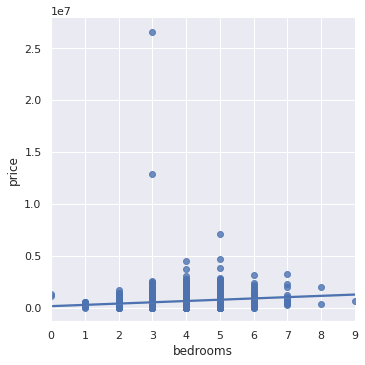

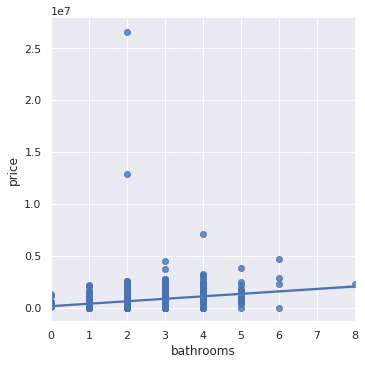

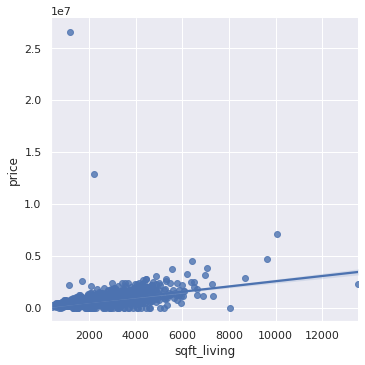

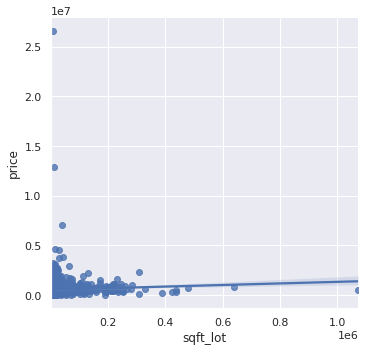

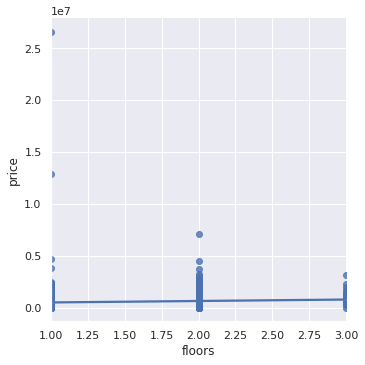

...

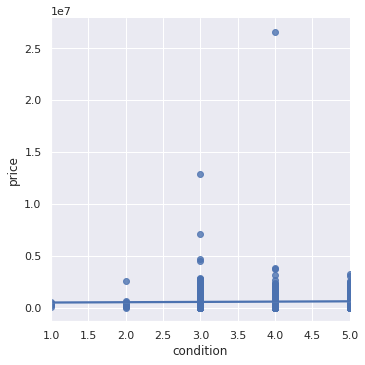

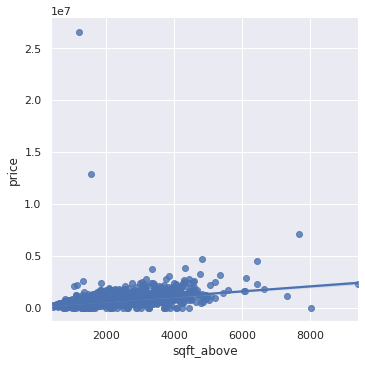

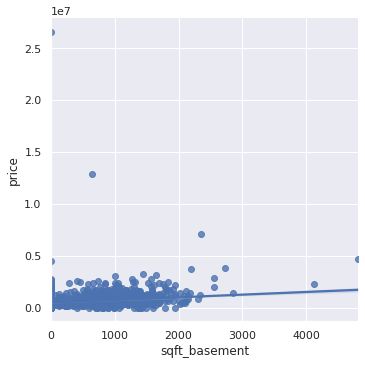

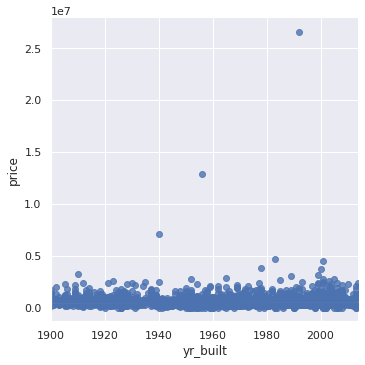

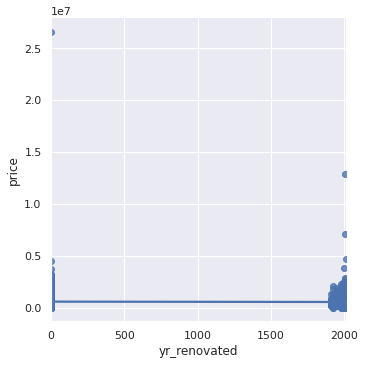

In [13]:
for i in houses_df.columns:
    if ( houses_df[i].dtype ==  np.int64 ) | ( houses_df[i].dtype ==  np.int32):
        sns.lmplot(x = i, y ='price', data = houses_df)

#### From above visualizations we can see that year renovated, year built, condition features  don't have significant impact on price. sqft_living, bathrooms, sqft_above, sqft_basement, view have strong influence.

### 1-Date

In [14]:
houses_df['date'].dt.year.unique(), houses_df['date'].dt.month.unique()

(array([2014]), array([5, 6, 7]))

In [15]:
houses_df['month']=  houses_df['date'].dt.month
houses_df.month.value_counts()

6    2179
5    1768
7     653
Name: month, dtype: int64

#### Drop date because data set with only 2014 as year and use month instead.

In [16]:
houses_df.drop(['date'], axis= 1, inplace= True)

In [17]:
houses_df.head(5)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country,month
0,313000.0,3,1,1340,7912,1,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA,5
1,2384000.0,5,2,3650,9050,2,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA,5
2,342000.0,3,2,1930,11947,1,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA,5
3,420000.0,3,2,2000,8030,1,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA,5
4,550000.0,4,2,1940,10500,1,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA,5


### 2-Country

In [18]:
houses_df['country'].unique()

array(['USA'], dtype=object)

### 3- Street

In [19]:
houses_df['street'].value_counts()

2520 Mulberry Walk NE        4
2500 Mulberry Walk NE        3
4313 SW Willow St            2
2050 14th Ave W              2
13800 453rd Ave SE           2
                            ..
10515 Ashworth Ave N         1
17010 NE 88th St             1
30929 NE Cherry Valley Rd    1
9325 NE 133rd St             1
620 151st Pl NE              1
Name: street, Length: 4525, dtype: int64

### 4-City

In [20]:
houses_df['city'].value_counts()

Seattle                1573
Renton                  293
Bellevue                286
Redmond                 235
Issaquah                187
Kirkland                187
Kent                    185
Auburn                  176
Sammamish               175
Federal Way             148
Shoreline               123
Woodinville             115
Maple Valley             96
Mercer Island            86
Burien                   74
Snoqualmie               71
Kenmore                  66
Des Moines               58
North Bend               50
Covington                43
Duvall                   42
Lake Forest Park         36
Bothell                  33
Newcastle                33
Vashon                   29
Tukwila                  29
SeaTac                   29
Enumclaw                 28
Carnation                22
Normandy Park            18
Clyde Hill               11
Fall City                11
Medina                   11
Black Diamond             9
Ravensdale                7
Pacific             

### 5- Statezip

In [21]:
houses_df['statezip'].value_counts()

WA 98103    148
WA 98052    135
WA 98117    132
WA 98115    130
WA 98006    110
           ... 
WA 98047      6
WA 98288      3
WA 98050      2
WA 98354      2
WA 98068      1
Name: statezip, Length: 77, dtype: int64

#### Drop country because data set with only USA this is useless, street also useless and statezip and use city as representable

In [22]:
houses_df.drop(['country','street','statezip'], axis= 1, inplace=True)
houses_df.head(5)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,city,month
0,313000.0,3,1,1340,7912,1,0,0,3,1340,0,1955,2005,Shoreline,5
1,2384000.0,5,2,3650,9050,2,0,4,5,3370,280,1921,0,Seattle,5
2,342000.0,3,2,1930,11947,1,0,0,4,1930,0,1966,0,Kent,5
3,420000.0,3,2,2000,8030,1,0,0,4,1000,1000,1963,0,Bellevue,5
4,550000.0,4,2,1940,10500,1,0,0,4,1140,800,1976,1992,Redmond,5


### 6-Bedrooms

In [23]:
houses_df['bedrooms'].value_counts()

3    2032
4    1531
2     566
5     353
6      61
1      38
7      14
0       2
8       2
9       1
Name: bedrooms, dtype: int64

#### Remove rows of 0,8,9 because they have low count and and useless

In [24]:
houses_df=houses_df[(houses_df['bedrooms']>0) & (houses_df['bedrooms']<8)]
houses_df['bedrooms'].value_counts()

3    2032
4    1531
2     566
5     353
6      61
1      38
7      14
Name: bedrooms, dtype: int64

In [25]:
houses_df.shape

(4595, 15)

### 7- Bathrooms

In [26]:
houses_df['bathrooms'].value_counts()

2    2310
1    1666
3     501
4      81
0      17
5      15
6       4
8       1
Name: bathrooms, dtype: int64

### 8-let's play with house area (sqft_living, sqft_lot, sqft_above, sqft_basement)

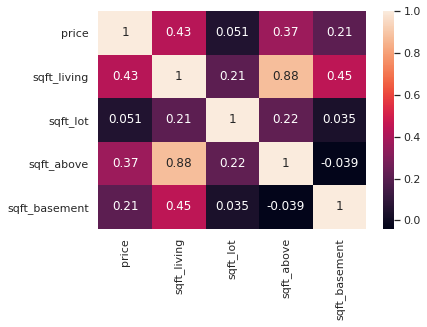

In [27]:
sns.heatmap(houses_df[["price", "sqft_living", "sqft_lot", "sqft_above", "sqft_basement"]].corr(), annot=True);

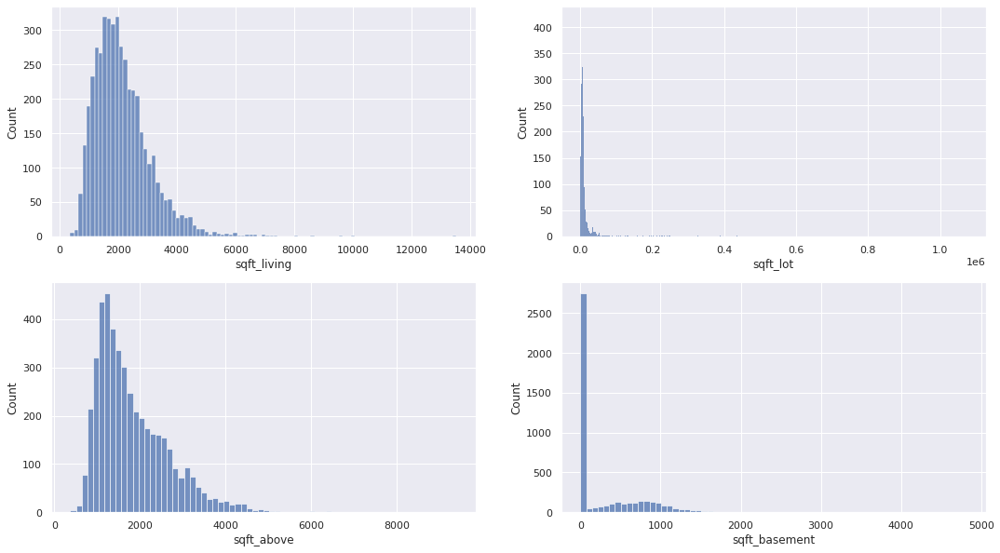

In [28]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))
sns.histplot(ax=axes[0, 0], x= 'sqft_living', data= houses_df);
sns.histplot(ax=axes[0, 1], x= 'sqft_lot', data= houses_df);
sns.histplot(ax=axes[1, 0], x= 'sqft_above', data= houses_df);
sns.histplot(ax=axes[1, 1], x= 'sqft_basement', data= houses_df);

#### From above visualizations in [Discover our Data] we can see that year renovated, year built, condition features  don't have significant impact on price. sqft_living, bathrooms, sqft_above, sqft_basement, view have strong influence.

#### and from this  Hisplot we find that sqft_living and above have good relation and dependent with price, but we will depend in all area features.

In [29]:
houses_df.head(5)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,city,month
0,313000.0,3,1,1340,7912,1,0,0,3,1340,0,1955,2005,Shoreline,5
1,2384000.0,5,2,3650,9050,2,0,4,5,3370,280,1921,0,Seattle,5
2,342000.0,3,2,1930,11947,1,0,0,4,1930,0,1966,0,Kent,5
3,420000.0,3,2,2000,8030,1,0,0,4,1000,1000,1963,0,Bellevue,5
4,550000.0,4,2,1940,10500,1,0,0,4,1140,800,1976,1992,Redmond,5


### 9-let's play with other house features (floors, waterfront, view, condition)

In [30]:
houses_df['floors'].value_counts()

1    2617
2    1849
3     129
Name: floors, dtype: int64

In [31]:
houses_df['waterfront'].value_counts()

0    4562
1      33
Name: waterfront, dtype: int64

In [32]:
houses_df['view'].value_counts()

0    4137
2     204
3     115
4      70
1      69
Name: view, dtype: int64

In [33]:
houses_df['condition'].value_counts()

3    2871
4    1252
5     434
2      32
1       6
Name: condition, dtype: int64

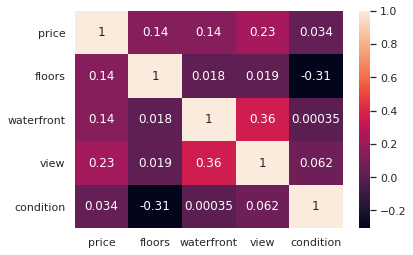

In [34]:
sns.heatmap(houses_df[["price", "floors", "waterfront", "view", "condition"]].corr(), annot=True);

### 10-yr_built

<AxesSubplot:>

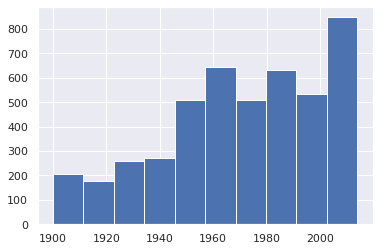

In [35]:
houses_df['yr_built'].hist()

#### 11- yr_renovated

<AxesSubplot:>

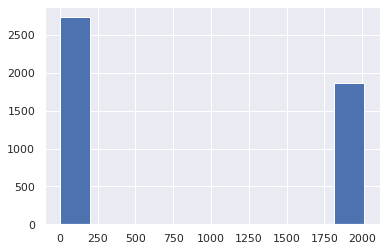

In [36]:
houses_df['yr_renovated'].hist()

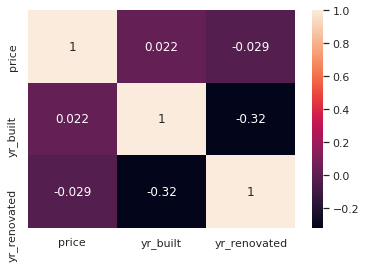

In [37]:
sns.heatmap(houses_df[["price", "yr_built", "yr_renovated"]].corr(), annot=True);

In [38]:
houses_df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,city,month
0,313000.0,3,1,1340,7912,1,0,0,3,1340,0,1955,2005,Shoreline,5
1,2384000.0,5,2,3650,9050,2,0,4,5,3370,280,1921,0,Seattle,5
2,342000.0,3,2,1930,11947,1,0,0,4,1930,0,1966,0,Kent,5
3,420000.0,3,2,2000,8030,1,0,0,4,1000,1000,1963,0,Bellevue,5
4,550000.0,4,2,1940,10500,1,0,0,4,1140,800,1976,1992,Redmond,5


#### 12- Finally Price 

In [39]:
houses_df['price'].describe().T

count    4.595000e+03
mean     5.514100e+05
std      5.635803e+05
min      0.000000e+00
25%      3.225000e+05
50%      4.600000e+05
75%      6.535000e+05
max      2.659000e+07
Name: price, dtype: float64

In [40]:
houses_df.price.value_counts()

0.0         49
300000.0    42
400000.0    31
600000.0    29
440000.0    29
            ..
334500.0     1
189650.0     1
406500.0     1
833000.0     1
368112.5     1
Name: price, Length: 1738, dtype: int64

In [41]:
houses_df.shape

(4595, 15)

#### cannot contains price with value zero

<AxesSubplot:>

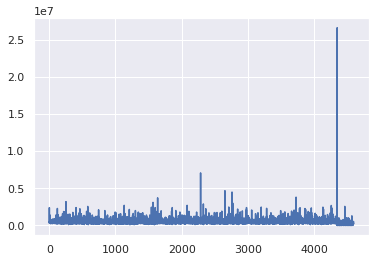

In [42]:
houses_df.price.plot()

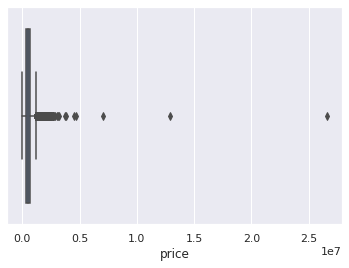

In [43]:
sns.boxplot(x='price', data= houses_df);

#### We have many outliers (we take the remove rows solution)

In [44]:
def remove_outliers(df, x):
    # Set Limits
    q25, q75 = np.percentile(df[x], 25), np.percentile(df[x], 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = 1 ,  (q75 + cut_off)
    df = df[(df[x] < upper) & (df[x] > lower)]
    print('Outliers of "{}" are removed\n'.format(x))
    return df

In [45]:
houses_df= remove_outliers(houses_df, 'price')

Outliers of "price" are removed



In [46]:
houses_df.shape

(4300, 15)

<AxesSubplot:>

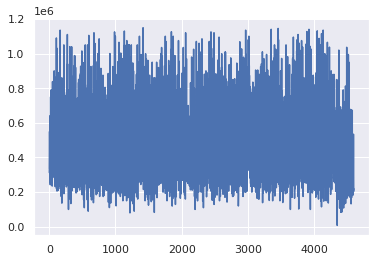

In [47]:
houses_df.price.plot()

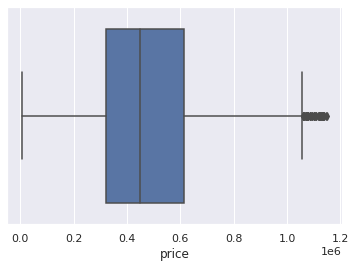

In [48]:
sns.boxplot(x='price', data= houses_df);

<AxesSubplot:>

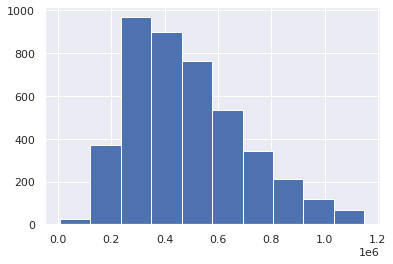

In [49]:
houses_df['price'].hist()

## After handle price let show the new correlation and graphs

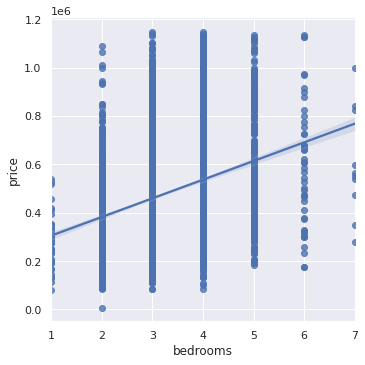

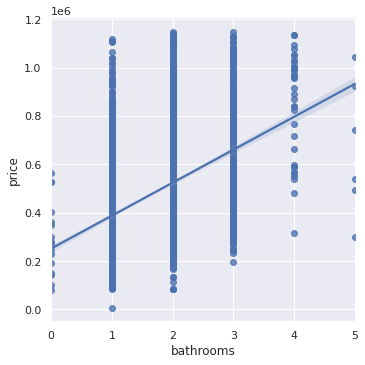

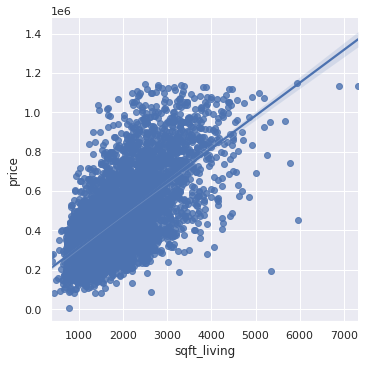

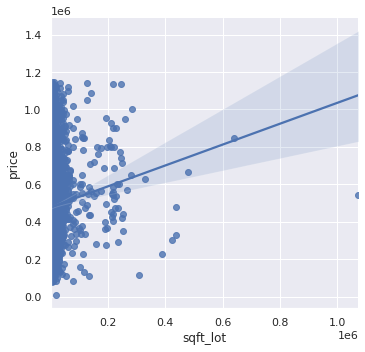

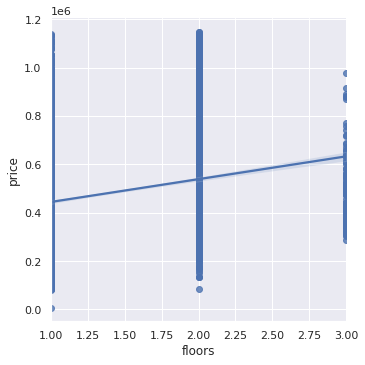

...

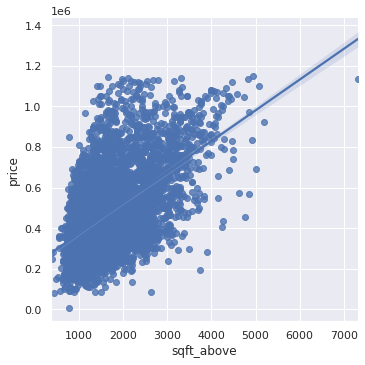

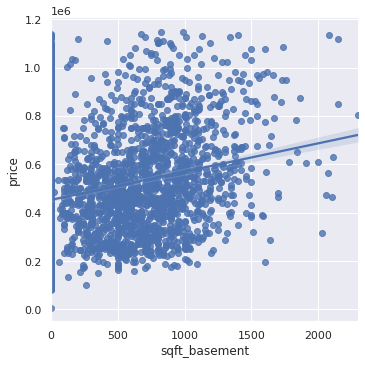

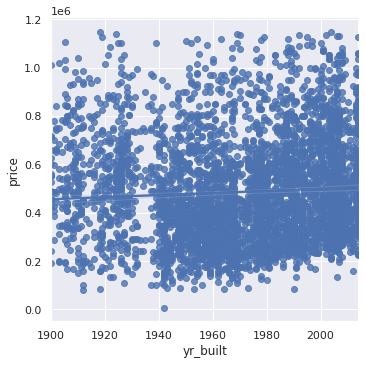

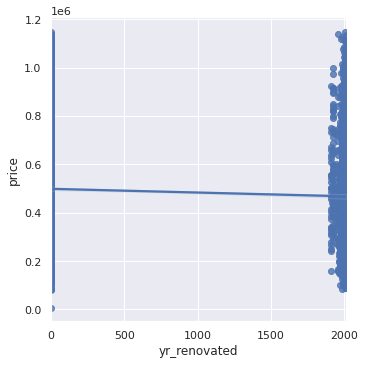

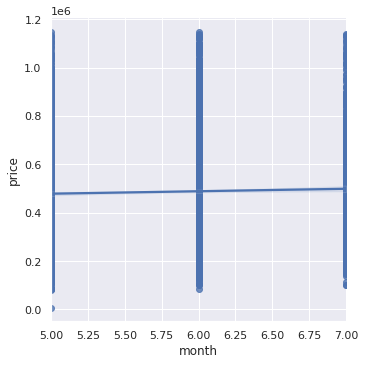

In [50]:
for i in houses_df.columns:
    if ( houses_df[i].dtype ==  np.int64 ) | ( houses_df[i].dtype ==  np.int32):
        sns.lmplot(x = i, y ='price', data = houses_df)

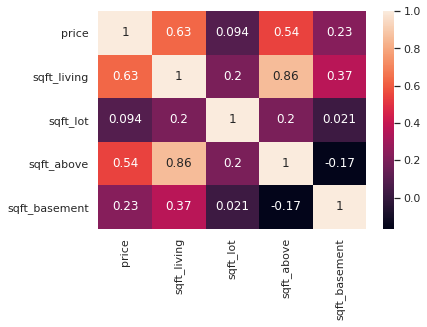

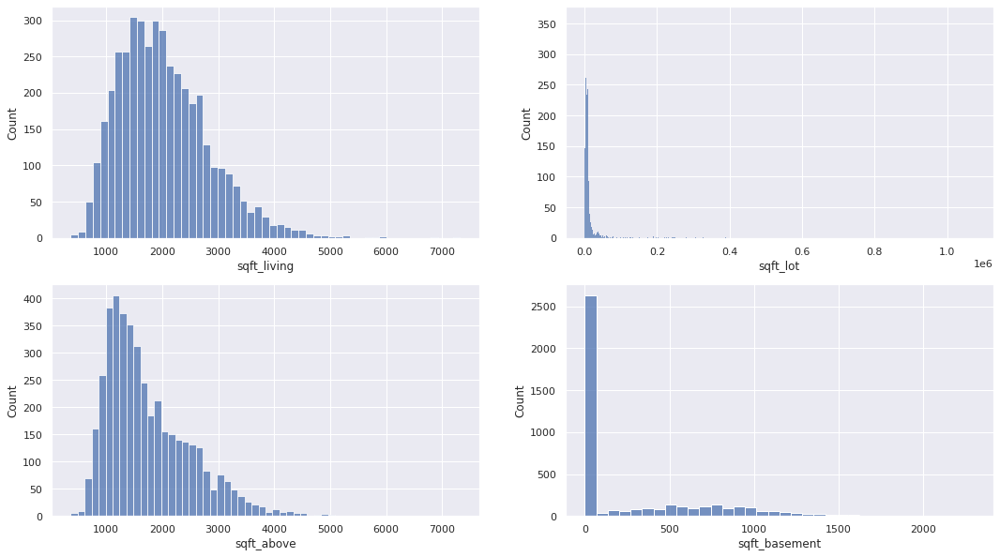

In [51]:
sns.heatmap(houses_df[["price", "sqft_living", "sqft_lot", "sqft_above", "sqft_basement"]].corr(), annot=True);



fig, axes = plt.subplots(2, 2, figsize=(18, 10))
sns.histplot(ax=axes[0, 0], x= 'sqft_living', data= houses_df);
sns.histplot(ax=axes[0, 1], x= 'sqft_lot', data= houses_df);
sns.histplot(ax=axes[1, 0], x= 'sqft_above', data= houses_df);
sns.histplot(ax=axes[1, 1], x= 'sqft_basement', data= houses_df);

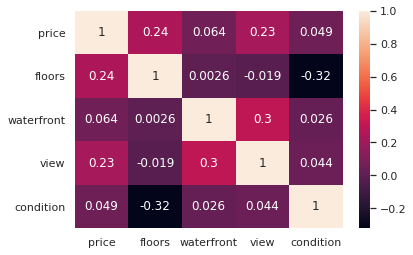

In [52]:
sns.heatmap(houses_df[["price", "floors", "waterfront", "view", "condition"]].corr(), annot=True);


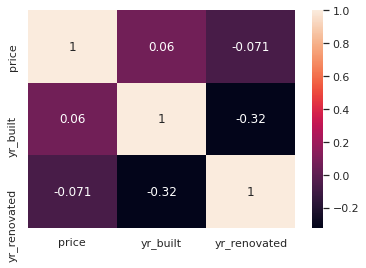

In [53]:
sns.heatmap(houses_df[["price", "yr_built", "yr_renovated"]].corr(), annot=True);

## Comparison
#### when compare the graphs and value before and after deal with price we see that is enhanced.

In [54]:
houses_df.head(5)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,city,month
0,313000.0,3,1,1340,7912,1,0,0,3,1340,0,1955,2005,Shoreline,5
2,342000.0,3,2,1930,11947,1,0,0,4,1930,0,1966,0,Kent,5
3,420000.0,3,2,2000,8030,1,0,0,4,1000,1000,1963,0,Bellevue,5
4,550000.0,4,2,1940,10500,1,0,0,4,1140,800,1976,1992,Redmond,5
5,490000.0,2,1,880,6380,1,0,0,3,880,0,1938,1994,Seattle,5


In [55]:
houses_df.corr(method ='pearson') 

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,month
price,1.000000,0.314871,0.430711,0.630180,0.093812,0.242447,0.063655,0.225348,0.049216,0.540543,0.230065,0.059769,-0.070517,0.032486
bedrooms,0.314871,1.000000,0.464231,0.599449,0.057138,0.134047,-0.032724,0.066174,0.018040,0.467897,0.302424,0.158167,-0.068591,0.015466
bathrooms,0.430711,0.464231,1.000000,0.650723,0.082837,0.471572,0.012635,0.107240,-0.138638,0.589025,0.181837,0.442292,-0.210341,0.012916
sqft_living,0.630180,0.599449,0.650723,1.000000,0.195969,0.329443,0.026759,0.198148,-0.081160,0.857017,0.366419,0.332588,-0.137937,0.034730
sqft_lot,0.093812,0.057138,0.082837,0.195969,1.000000,-0.015592,0.025143,0.076999,0.007857,0.195845,0.021435,0.038791,-0.013411,-0.020283
floors,0.242447,0.134047,0.471572,0.329443,-0.015592,1.000000,0.002591,-0.019475,-0.321542,0.519363,-0.307278,0.590961,-0.256346,0.032214
waterfront,0.063655,-0.032724,0.012635,0.026759,0.025143,0.002591,1.000000,0.302356,0.025565,0.017821,0.019036,-0.036852,0.007239,-0.001889
view,0.225348,0.066174,0.107240,0.198148,0.076999,-0.019475,0.302356,1.000000,0.043723,0.083223,0.228965,-0.062962,0.039908,-0.024101
condition,0.049216,0.018040,-0.138638,-0.081160,0.007857,-0.321542,0.025565,0.043723,1.000000,-0.201891,0.209218,-0.398049,-0.183304,0.018201
sqft_above,0.540543,0.467897,0.589025,0.857017,0.195845,0.519363,0.017821,0.083223,-0.201891,1.000000,-0.165423,0.452832,-0.174019,0.042136


In [56]:
houses_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4300 entries, 0 to 4599
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          4300 non-null   float64
 1   bedrooms       4300 non-null   int64  
 2   bathrooms      4300 non-null   int64  
 3   sqft_living    4300 non-null   int64  
 4   sqft_lot       4300 non-null   int64  
 5   floors         4300 non-null   int64  
 6   waterfront     4300 non-null   int64  
 7   view           4300 non-null   int64  
 8   condition      4300 non-null   int64  
 9   sqft_above     4300 non-null   int64  
 10  sqft_basement  4300 non-null   int64  
 11  yr_built       4300 non-null   int64  
 12  yr_renovated   4300 non-null   int64  
 13  city           4300 non-null   object 
 14  month          4300 non-null   int64  
dtypes: float64(1), int64(13), object(1)
memory usage: 537.5+ KB


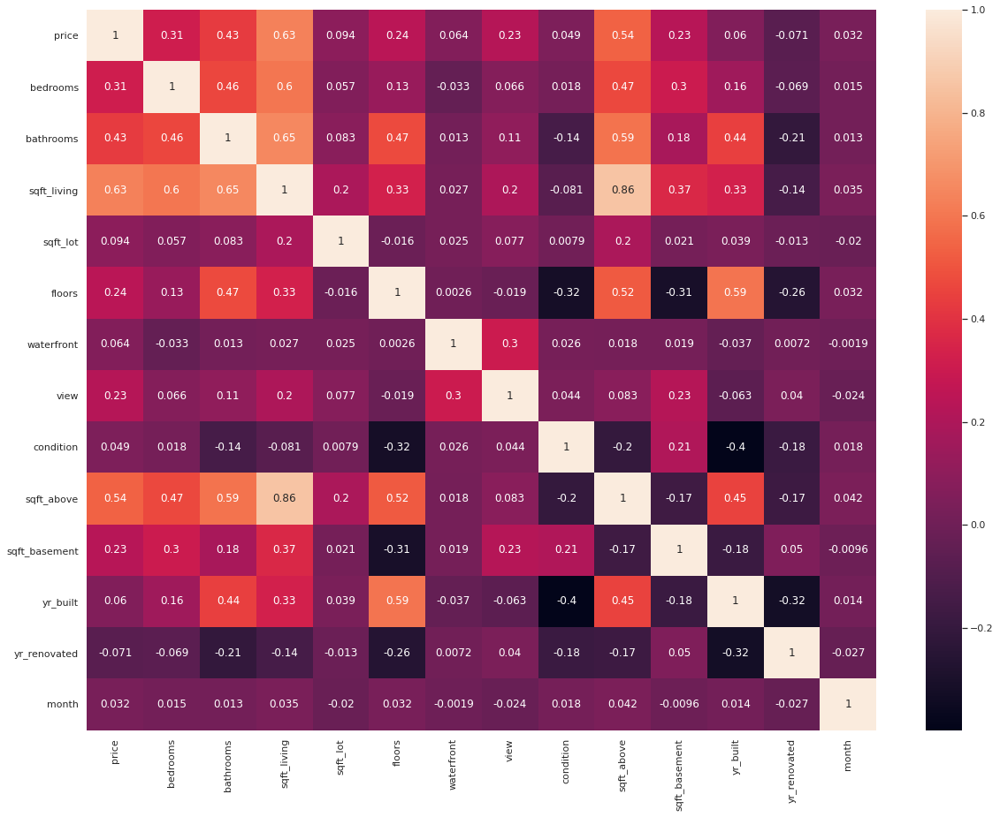

In [57]:
plt.figure(figsize=(20,15))
sns.heatmap(houses_df.corr(), annot=True)
plt.show()

# Prepare Data to go to Model

In [58]:
from pandas_profiling import ProfileReport
houses_price_profile=ProfileReport(houses_df,title='Final House Prices Profile')
houses_price_profile

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## we must convert city Data to Categorical Data to get into model.


In [59]:
df=houses_df
df= pd.get_dummies(df, drop_first=True)
df.head().T

,0,2,3,4,5
price,313000.0,342000.0,420000.0,550000.0,490000.0
bedrooms,3.0,3.0,3.0,4.0,2.0
bathrooms,1.0,2.0,2.0,2.0,1.0
sqft_living,1340.0,1930.0,2000.0,1940.0,880.0
sqft_lot,7912.0,11947.0,8030.0,10500.0,6380.0
floors,1.0,1.0,1.0,1.0,1.0
waterfront,0.0,0.0,0.0,0.0,0.0
view,0.0,0.0,0.0,0.0,0.0
condition,3.0,4.0,4.0,4.0,3.0
sqft_above,1340.0,1930.0,1000.0,1140.0,880.0


# Splitting Data to Train and Test

In [60]:
# Label
y= df.price.values
#Features
X = df.drop('price', axis =1).values

In [61]:
#Spliting Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [62]:
#Scaling Data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [63]:
#Mean and standard deviation of X_train
X_train.mean(), X_train.std()

(2.1540539746880114e-17, 0.9819805060619633)

# Linear Regression Model

In [64]:
# Run Linear Regression Model and print accuracy
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
y_pred = lin_reg.predict(X_test)
print("Training acc >> ", lin_reg.score(X_train, y_train))
print("Testing acc >>  ", lin_reg.score(X_test, y_test))

Training acc >>  0.7030948497983267
Testing acc >>   -8.924262544179082e+19


#### Let's use Cross val Score

In [65]:
#Cross Val Score
lin_reg = LinearRegression()
cvscores_10 = cross_val_score(lin_reg, X, y, cv= 10)
print(np.mean(cvscores_10))

0.6707763321887047


## Random Forest Regressor

In [66]:
rf_reg = RandomForestRegressor(random_state=0)
rf_reg.fit(X_train, y_train)
print("Training acc >> ", rf_reg.score(X_train, y_train))
print("Testing acc >> ", rf_reg.score(X_test, y_test))

Training acc >>  0.956288386199113
Testing acc >>  0.6768098109321381


#### Overfitting

## Lasso Regression

In [67]:
lasso_reg= Lasso(max_iter=10000)
lasso_reg.fit(X_train, y_train)
print("Training acc >> ", lasso_reg.score(X_train, y_train))
print("Testing acc >> ", lasso_reg.score(X_test, y_test))

Training acc >>  0.7030944583129877
Testing acc >>  0.6288196407298965


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:532: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49329551247.88281, tolerance: 15918445648.214844
  positive)
